In [1]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
from tensorflow.keras import datasets, layers, models, regularizers, losses
from load_data import DataLoader
from interpolated_datagenerator import InterpolatedDataGenerator
from CustomCall import LoggingCallback
from CustomMSE import MeanSquaredErrorDobson

In [2]:
measurements = ['SO2', 'CO', 'H2O', 'HCl', 'HNO3', 'N2O', 'Temperature']
time = [2004248, 2024010]
lon = [-177.5, 177.5]
lat = [-88, 0]
time_step = 365

dataloader = DataLoader(measurements=measurements, time_period=time, time_step=365)
X_files, y_files = dataloader.get_files()


train_size = len(X_files) * 6 // 10
validation_size = len(X_files) * 2 // 10
test_size = len(X_files) * 2 // 10


X_train = X_files[:train_size]
y_train = y_files[:train_size]

X_validation = X_files[train_size:train_size + validation_size]
y_validation = y_files[train_size:train_size + validation_size]

X_test = X_files[train_size + validation_size:]
y_test = y_files[train_size + validation_size:]


In [3]:
if not os.path.isdir("saved"):
    os.mkdir("saved")
 
# Save names of files
save_name = os.path.join('saved', 'interpolated_cnn_model')
checkpoint_save_name = save_name + '_cnn_net.chk'


In [4]:
training_data = InterpolatedDataGenerator(X_files=X_train, y_files=y_train, batch_size=16, shuffle=True, data_aug=False, normalise=True, normalise_sample=500, lon_range=lon, lat_range=lat)

norm_dict = training_data.get_norm_dict()

validation_data = InterpolatedDataGenerator(X_files=X_validation, y_files=y_validation, batch_size=16, shuffle=True, data_aug=False, normalise=True, norm_dict=norm_dict,  lon_range=lon, lat_range=lat)
test_data = InterpolatedDataGenerator(X_test, y_test, batch_size=16, shuffle=False, data_aug=False, normalise=True, norm_dict=norm_dict,  lon_range=lon, lat_range=lat)


  0% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
  0% (1 of 500) |                        | Elapsed Time: 0:00:00 ETA:   0:02:38
  0% (2 of 500) |                        | Elapsed Time: 0:00:00 ETA:   0:02:35
  0% (3 of 500) |                        | Elapsed Time: 0:00:00 ETA:   0:02:34
  0% (4 of 500) |                        | Elapsed Time: 0:00:01 ETA:   0:02:32
  1% (5 of 500) |                        | Elapsed Time: 0:00:01 ETA:   0:02:33
  1% (6 of 500) |                        | Elapsed Time: 0:00:01 ETA:   0:02:35
  1% (7 of 500) |                        | Elapsed Time: 0:00:02 ETA:   0:02:33
  1% (8 of 500) |                        | Elapsed Time: 0:00:02 ETA:   0:02:32
  1% (9 of 500) |                        | Elapsed Time: 0:00:02 ETA:   0:02:31
  2% (10 of 500) |                       | Elapsed Time: 0:00:03 ETA:   0:02:30
  2% (11 of 500) |                       | Elapsed Time: 0:00:03 ETA:   0:02:29
  2% (12 of 500) |                      

In [5]:
batch_X, batch_y = training_data[6]
input_shape = batch_X.shape[1:]
output_shape = batch_y.shape[1:]
H, W, C = output_shape

# 322 i think
output_shape = (H, W, C)
print("Input shape:", input_shape)
print("Output shape:", output_shape)
print(len(test_data), len(validation_data))

Input shape: (72, 23, 322)
Output shape: (72, 23, 37)
83 83


In [6]:
for batch_X, batch_y in training_data:
    # print("Max min batch X: ", np.min(batch_X), np.max(batch_X))
    # print("Max min batch y: ", np.min(batch_y), np.max(batch_y))
    print(batch_X.shape, batch_y.shape)
    

print("Validation data:")
for batch_X, batch_y in validation_data:
    print(batch_X.shape, batch_y.shape)
    

    

(16, 72, 23, 322) (16, 72, 23, 37)
Validation data:
(16, 72, 23, 322) (16, 72, 23, 37)


In [7]:
print(lon, lat)
# training_data.make_map(batch_X[0], lon, lat)

[-177.5, 177.5] [-88, 0]


In [8]:
model = models.Sequential()
# from here to 1e-5
# try not on conv but on dense layers
# Try batch normalisation after 3rd conv layer - just test it
l2_lambda = 0.0001

# still to try:
# batch normalisation, SGD optimiser

# lech had 32 64 128 - conv, 512 dense layer, adam optimiser 0.001

model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
# ADD batch norm here
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
# ADD batch norm here
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))


model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
# ADD batch norm here
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

# model.add(layers.Dropout(0.25)) 

model.add(layers.Flatten())


# Only regularise on dense layers but not the last one 
model.add(layers.Dense(512, activation='relu')) #, kernel_regularizer=regularizers.l2(l2_lambda)
model.add(layers.Dense(512, activation='relu')) # , kernel_regularizer=regularizers.l2(l2_lambda)
model.add(layers.Dropout(0.25))

model.add(layers.Dense(H * W * C, activation='linear'))


model.add(layers.Reshape(output_shape))

# Can try SGD with a higher learning rate 
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model.compile(optimizer=optimizer, loss=losses.MSE, metrics = [MeanSquaredErrorDobson(norm_dict['O3'][1], norm_dict['O3'][0])])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 72, 23, 32)        92768     
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 23, 32)        9248      
                                                                 
 conv2d_2 (Conv2D)           (None, 72, 23, 32)        9248      
                                                                 
 batch_normalization (BatchN  (None, 72, 23, 32)       128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 36, 11, 32)       0         
 )                                                               
                                                                 
 conv2d_3 (Conv2D)           (None, 36, 11, 64)        1

In [9]:
# loggingCallback = LoggingCallback(model=model)
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_save_name,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

In [10]:
# print('evaluating untrained model...')
# error = model.evaluate(test_data)
# print(error)

In [11]:
history = model.fit(training_data,
        validation_data=validation_data,
        epochs=30,
        verbose=1)

Epoch 1/30
247/247 [==============================] - ETA: 0s - loss: 0.0047 - ppmv: 5.6847e-07 

InvalidArgumentError: Graph execution error:

2 root error(s) found.
  (0) INVALID_ARGUMENT:  ValueError: need at least one array to stack
Traceback (most recent call last):

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\tensorflow\python\ops\script_ops.py", line 271, in __call__
    ret = func(*args)

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\tensorflow\python\autograph\impl\api.py", line 642, in wrapper
    return func(*args, **kwargs)

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\tensorflow\python\data\ops\dataset_ops.py", line 1035, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\keras\engine\data_adapter.py", line 903, in wrapped_generator
    for data in generator_fn():

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\keras\engine\data_adapter.py", line 1050, in generator_fn
    yield x[i]

  File "c:\Users\simma362\Desktop\Code\Baseline-CNN\baseline-cnn\interpolated_datagenerator.py", line 318, in __getitem__
    X, y = self.__data_generation(list_IDs_temp)

  File "c:\Users\simma362\Desktop\Code\Baseline-CNN\baseline-cnn\interpolated_datagenerator.py", line 207, in __data_generation
    y = np.stack(y, axis=0)

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\numpy\core\shape_base.py", line 445, in stack
    raise ValueError('need at least one array to stack')

ValueError: need at least one array to stack


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]]
	 [[Shape/_6]]
  (1) INVALID_ARGUMENT:  ValueError: need at least one array to stack
Traceback (most recent call last):

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\tensorflow\python\ops\script_ops.py", line 271, in __call__
    ret = func(*args)

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\tensorflow\python\autograph\impl\api.py", line 642, in wrapper
    return func(*args, **kwargs)

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\tensorflow\python\data\ops\dataset_ops.py", line 1035, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\keras\engine\data_adapter.py", line 903, in wrapped_generator
    for data in generator_fn():

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\keras\engine\data_adapter.py", line 1050, in generator_fn
    yield x[i]

  File "c:\Users\simma362\Desktop\Code\Baseline-CNN\baseline-cnn\interpolated_datagenerator.py", line 318, in __getitem__
    X, y = self.__data_generation(list_IDs_temp)

  File "c:\Users\simma362\Desktop\Code\Baseline-CNN\baseline-cnn\interpolated_datagenerator.py", line 207, in __data_generation
    y = np.stack(y, axis=0)

  File "c:\Users\simma362\AppData\Local\anaconda3\envs\neuralnet\lib\site-packages\numpy\core\shape_base.py", line 445, in stack
    raise ValueError('need at least one array to stack')

ValueError: need at least one array to stack


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]]
0 successful operations.
0 derived errors ignored. [Op:__inference_test_function_3346]

dict_keys(['loss', 'ppmv', 'val_loss', 'val_ppmv'])


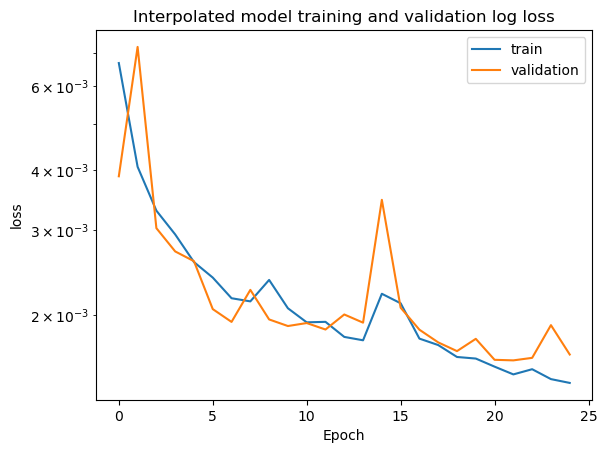

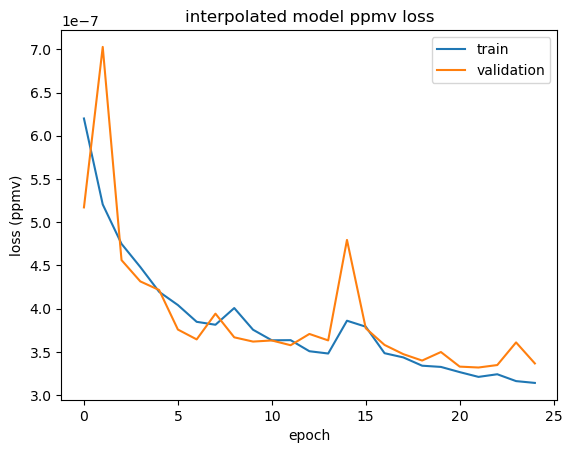

In [19]:
print(history.history.keys())
#  "Accuracy"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Interpolated model training and validation log loss')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.yscale('log')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()
# "Loss"
plt.plot(history.history['ppmv'])
plt.plot(history.history['val_ppmv'])
plt.title('interpolated model ppmv loss')
plt.ylabel('loss (ppmv)')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
error = model.evaluate(test_data)
print(error)

In [25]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def make_map(vector, lon_range, lat_range, titleStr = "O3 Concentration Heatmap"):
    lon_start = lon_range[0]
    lon_end = lon_range[-1]
    lat_start = lat_range[0]
    lat_end = lat_range[-1]

    lon = np.arange(lon_start-5, lon_end, 5)
    lat = np.arange(lat_start-4, lat_end, 4)
    
    lon_grid, lat_grid = np.meshgrid(lon, lat)

    for i in range(vector.shape[-1]):
        fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, edgecolor='black')
        ax.add_feature(cfeature.OCEAN)

        heatmap = ax.pcolormesh(lon_grid, lat_grid, vector[0, :, :, i].T, transform=ccrs.PlateCarree(), cmap='viridis')

        cbar = plt.colorbar(heatmap, ax=ax, orientation='vertical', pad=0.05)
        cbar.set_label('Concentration')

        ax.set_title(titleStr)

        plt.show()

1/1 [==============================] - 0s 38ms/step
1.18200405e-05
1.19500655e-05
-3.424043e-08
6.4119376e-11


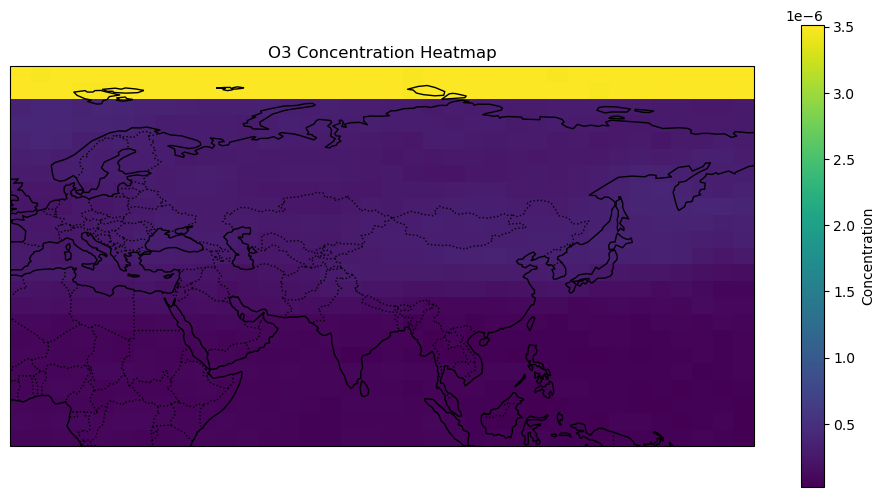

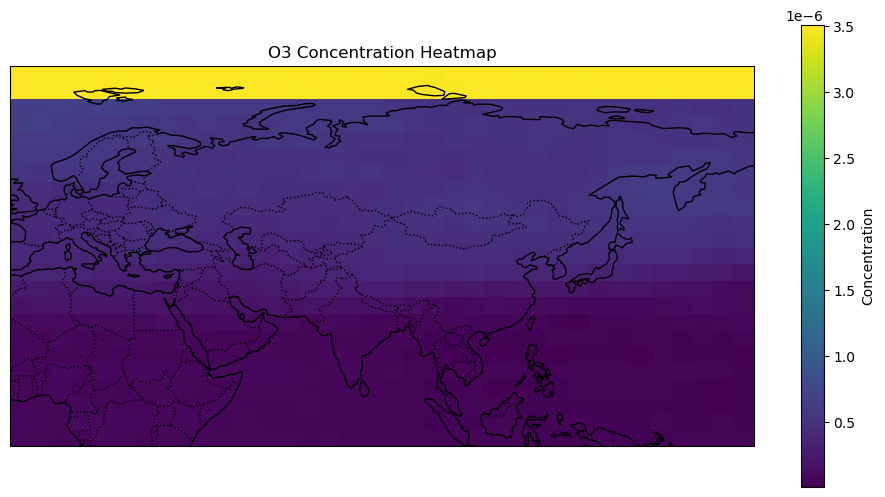

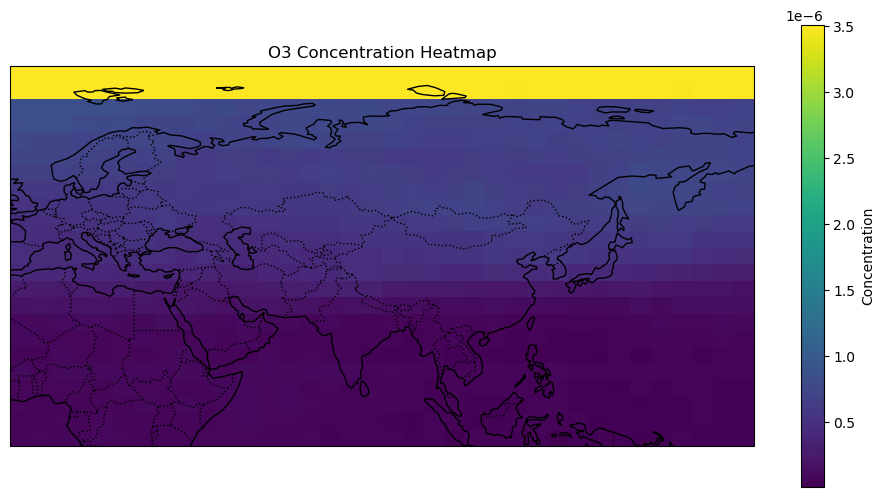

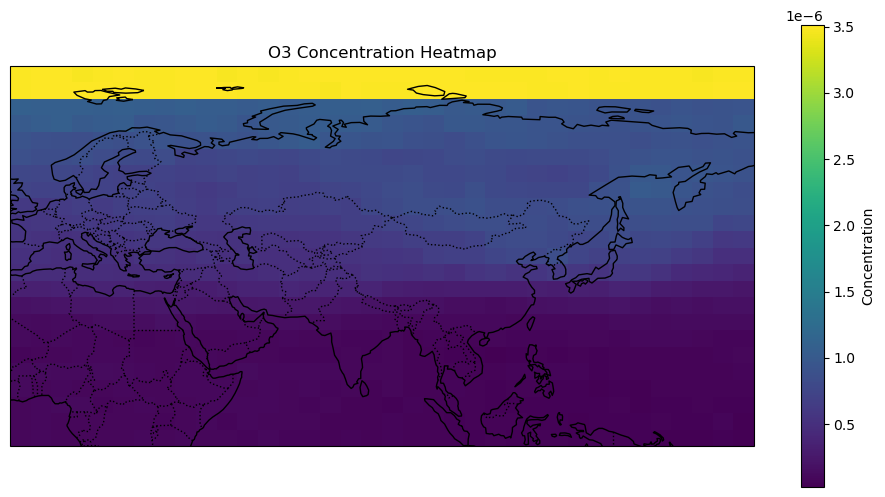

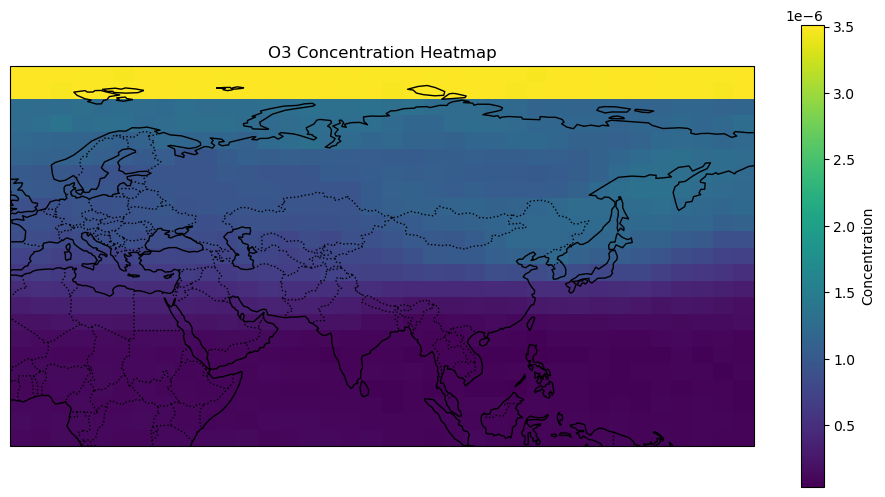

...

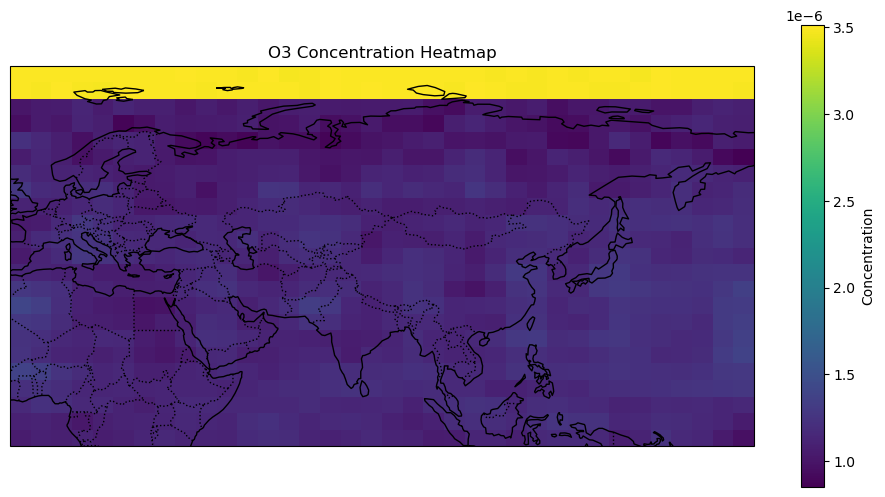

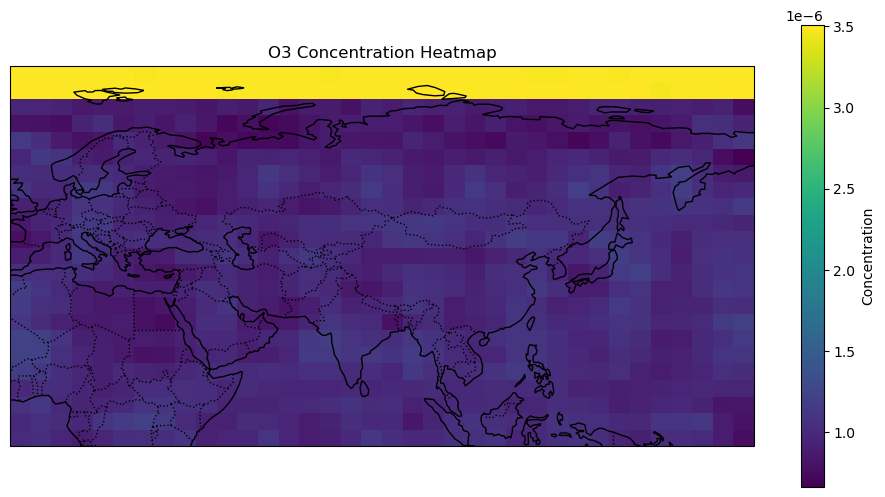

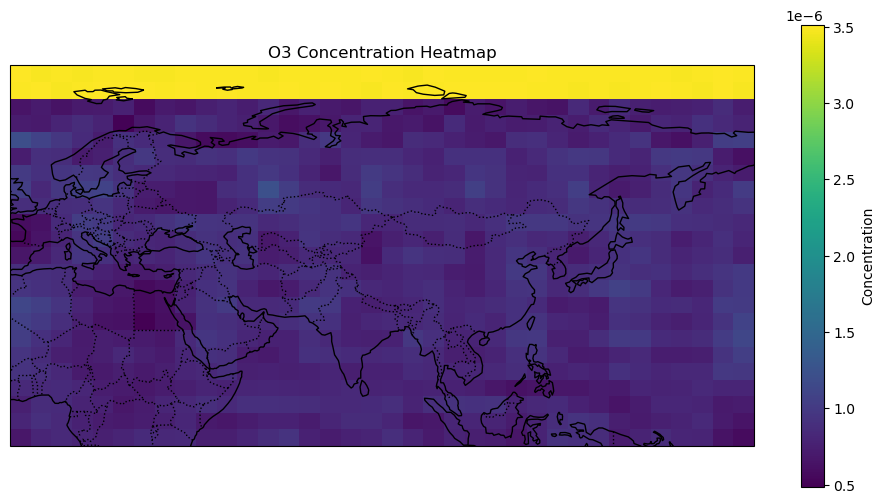

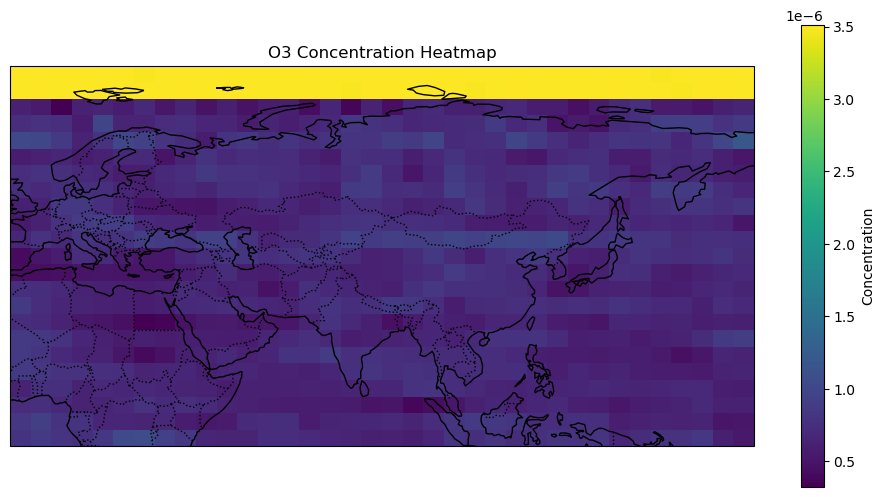

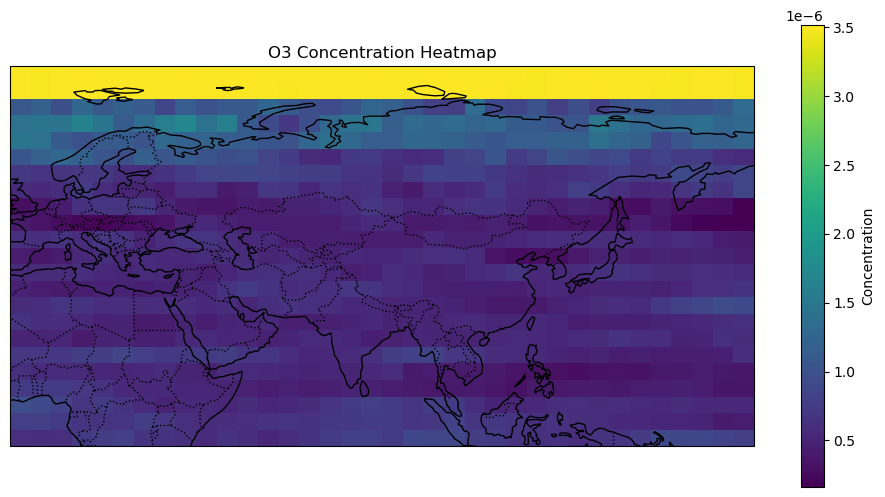

actual:


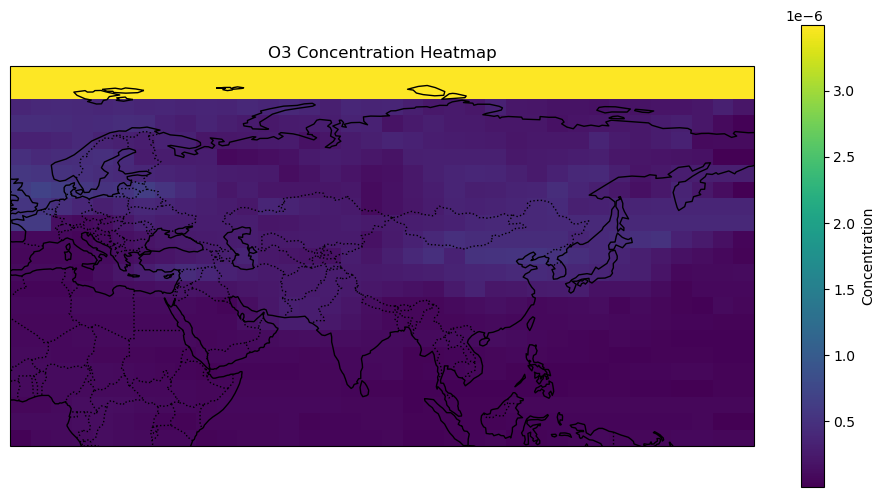

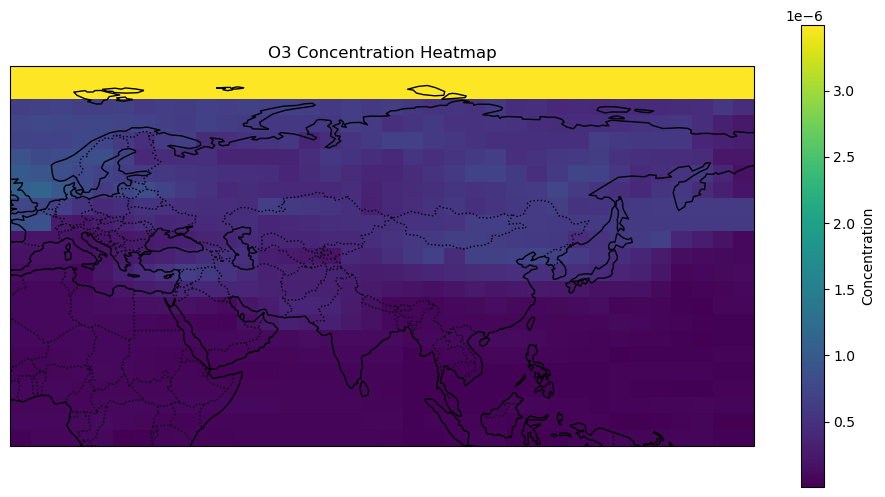

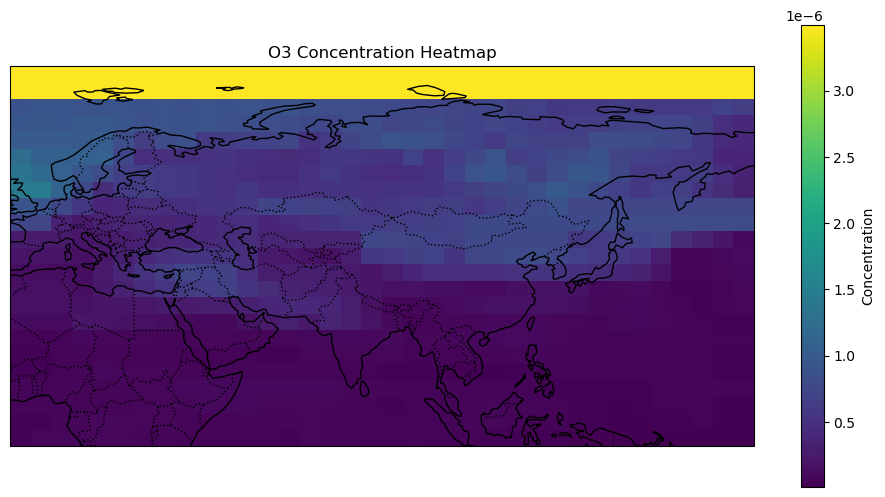

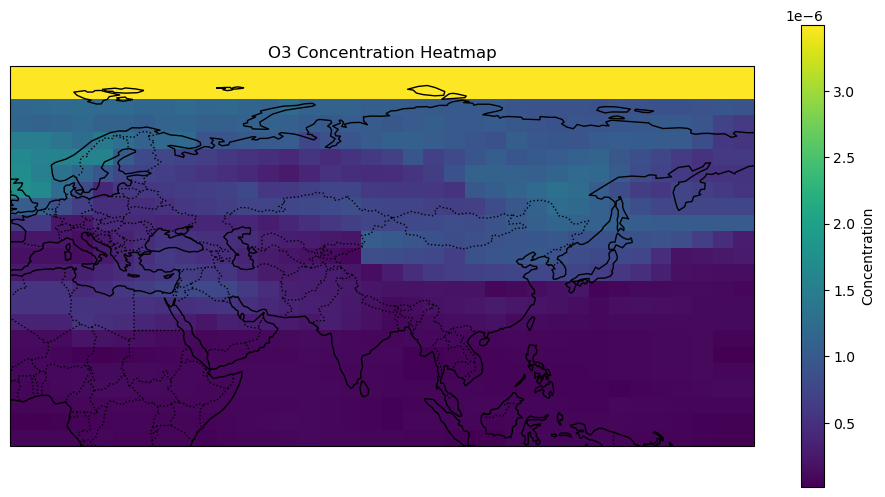

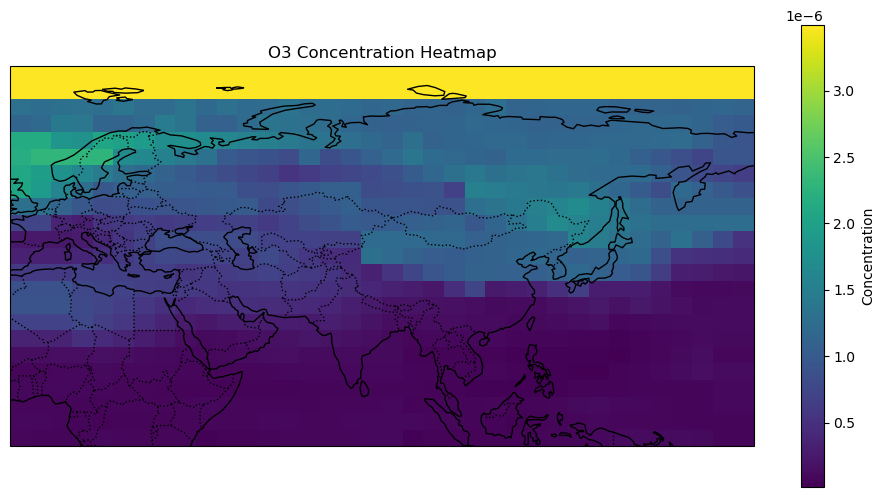

...

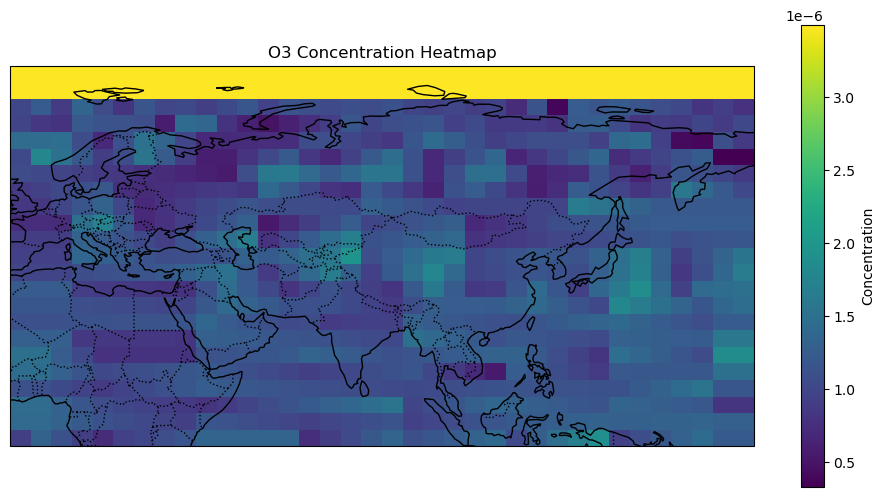

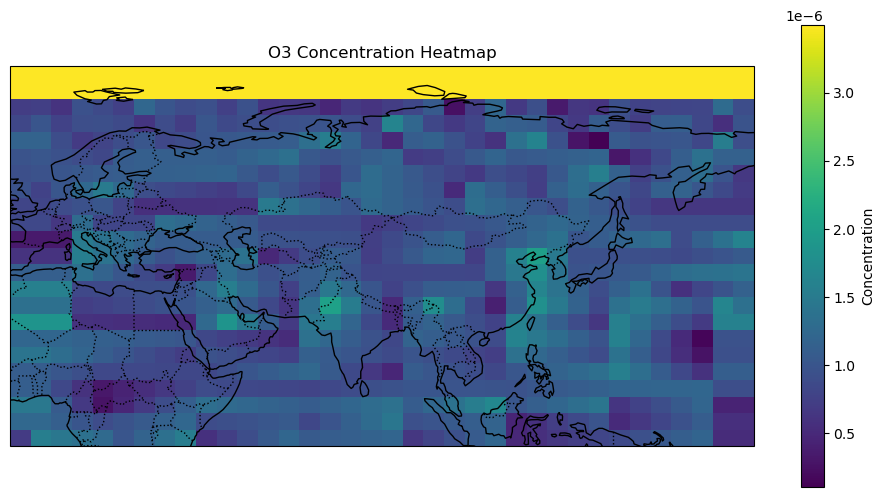

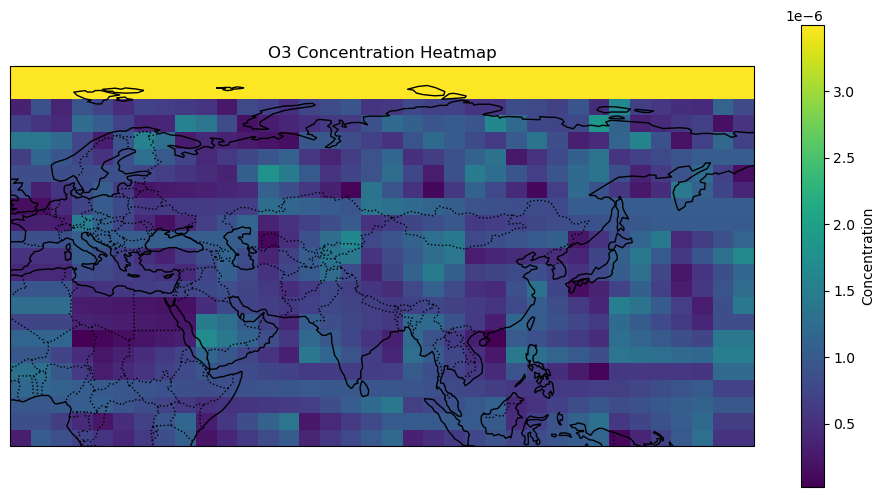

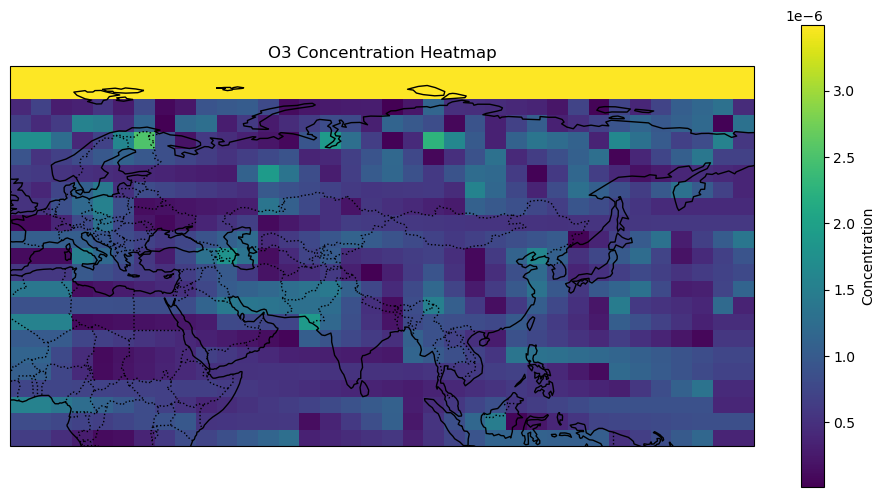

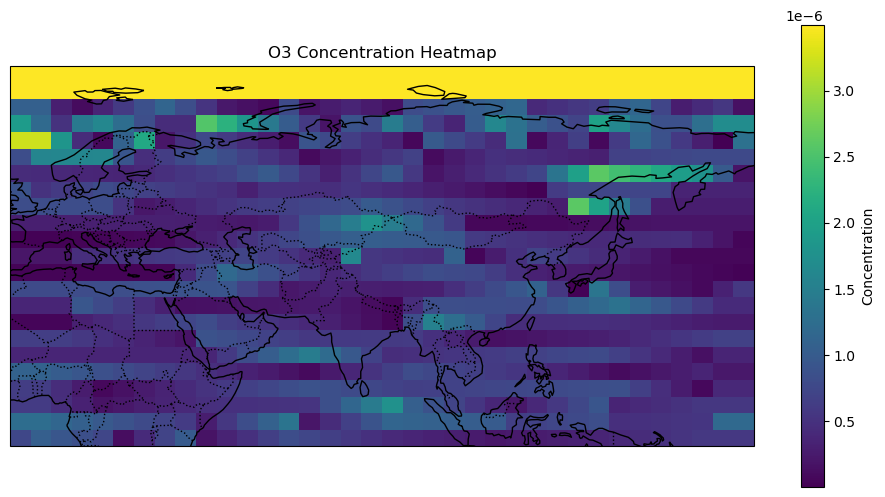

In [26]:
"""
Convert output and measure accuracy on real values
normalise them back to actual values, check that reverse normalisation works - check on true output 
measure MSE is on that to get the metrics
reverse normalisation what you expect
"""


batch_X, batch_y = test_data[0]
predictions = model.predict(batch_X)
# print(f'Test Predictions: {predictions[0][0]}')
predictions *= norm_dict['O3'][1]
predictions += norm_dict['O3'][0]
batch_y *= norm_dict['O3'][1]
batch_y += norm_dict['O3'][0]

print(np.max(predictions))
print(np.max(batch_y))

print(np.min(predictions))
print(np.min(batch_y))

make_map(predictions, lon_range = lon, lat_range = lat)
print('actual:')
make_map(batch_y, lon_range=lon, lat_range=lat)
